In [133]:
import matplotlib.pyplot as plt

import numpy as np

import skimage
from skimage import io, data, exposure, transform
from skimage.color import rgb2gray
from scipy import signal, fft

from IPython.display import display

import math as m
import cv2

import random


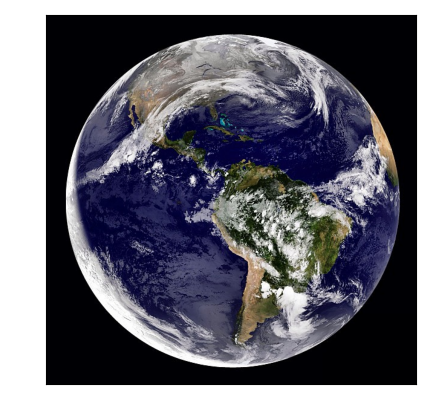

In [134]:
########## Cviko 2 #########
image = io.imread("imgs/earth.jpg")
plt.imshow(image)

In [135]:
image2 = np.zeros(image.shape,dtype = int)
image3 = image
x = 2
y = 2
qwer = []

for i in range(x):
    for j in range(y):
        qwer.append((i,j))
qwer = random.sample(qwer,x*y)
xpoint = 612/x
ypoint = 612/y

for i in range(x):
    for j in range(y):
        xstart = i * xpoint
        ystart = j * ypoint
        x2 = qwer[j-y*i][0] * xpoint
        y2 = qwer[j-y*i][1] * ypoint
        #image2[xstart : xstart + xpoint, ystart : ystart + ypoint] = image[x2 : x2 + xpoint, y2 : y2 + ypoint]

#plt.imshow(image2)

########## Cviko 3 #########

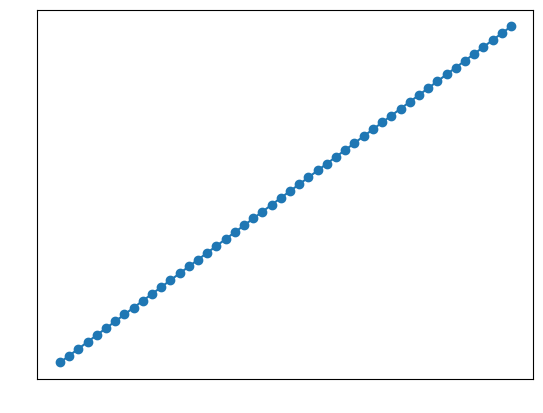

In [136]:
x = np.linspace(0, 5*np.pi, 50)
plt.plot(x,"o-")

Text(0.5, 1.0, 'Vektor x,y')

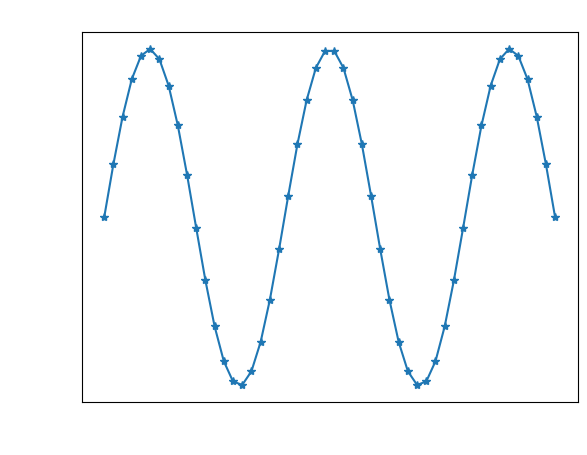

In [137]:
plt.figure()
y = np.sin(x)
plt.plot(x,y,"*-")
plt.ylabel("Y- Value of sin(x)")
plt.xlabel("X- Value of x")
plt.title('Vektor x,y')

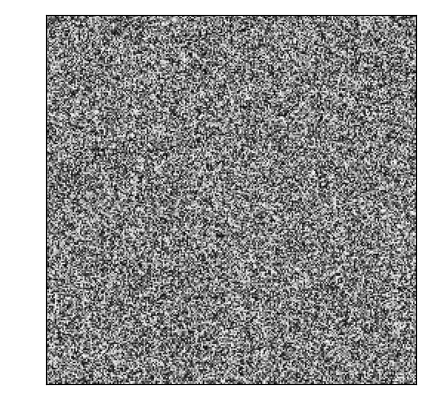

In [138]:
plt.figure()
rand_img = np.random.rand(250,250)
plt.imshow(rand_img)

Text(0.5, 1.0, 'Lena in RGB')

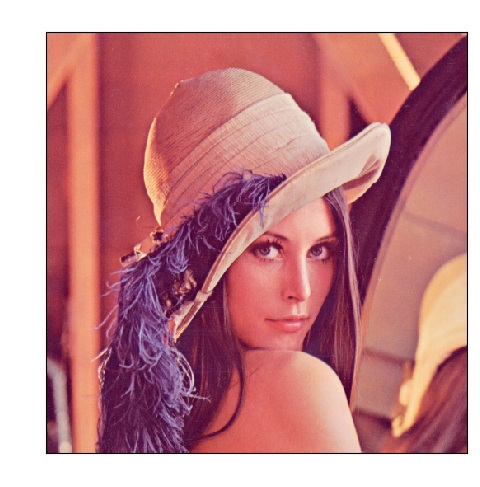

In [139]:
image = io.imread("imgs/lena.png")
#fig,ax = plt.subplots()
io.imshow(image)
plt.title('Lena in RGB')

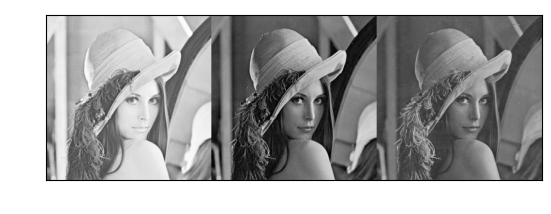

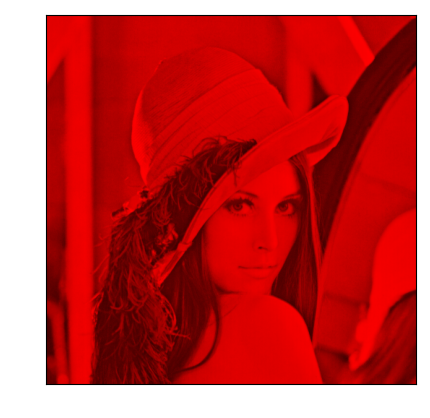

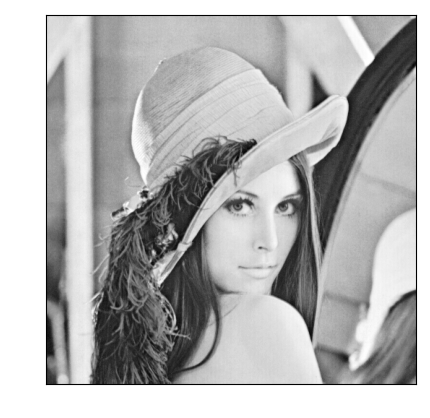

In [140]:
plt.figure()
plt.imshow(np.concatenate((image[:,:,0], image[:,:,1], image[:,:,2]),1), cmap='gray')
image_R = np.array(image)
image_R[:,:,1:] = 0
plt.figure()
plt.imshow(image_R)
plt.figure()
img = image_R[:,:,0].astype(dtype=np.uint8)
plt.imshow(img,cmap='gray')

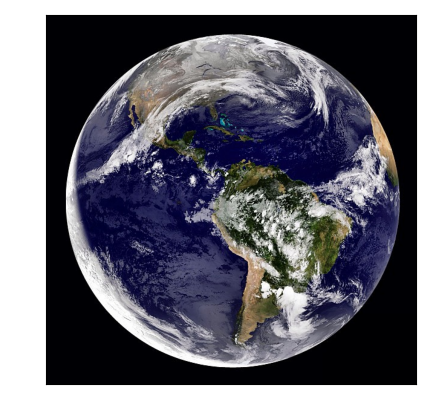

In [141]:
image = io.imread("imgs/earth.jpg")
fig = plt.figure()
ax = fig.add_subplot(111)
plt.imshow(image)
ax.set_aspect('equal')

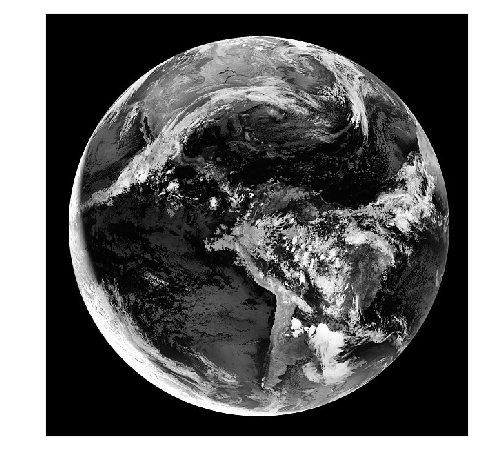

In [142]:
image = io.imread("imgs/earth.jpg")
i_gray = 0.2126 * image[:,:,0] + 0.7152 * image[:,:,1] + 0.0722 * image[:,:,2]
i_gray = i_gray.astype(dtype = np.uint8)
io.imshow(i_gray)

Sum error between methods:  3618
Average error:  0.009659746251441753


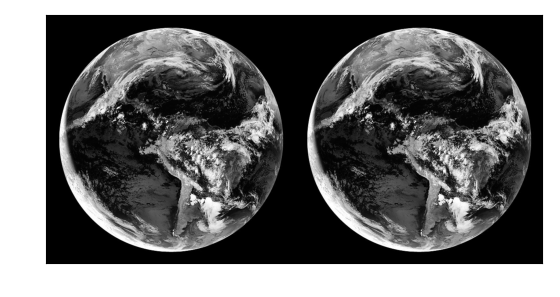

In [143]:
from skimage.color import rgb2gray

#image = io.imread("imgs/lena.png")
i_gray2 = (rgb2gray(image)*255).astype(dtype=np.uint8)
print("Sum error between methods: ", np.sum((i_gray2 - i_gray)**2))
print("Average error: ", np.sum((i_gray2 - i_gray)**2)/i_gray2.size)

plt.figure()
plt.imshow(np.concatenate((i_gray, i_gray2), 1), cmap='gray')

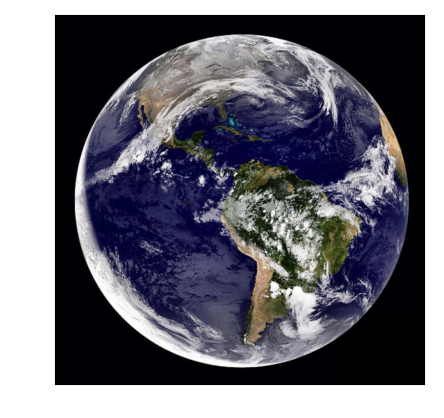

In [144]:
I_resized = transform.resize(image, np.array(i_gray.shape)*2)
plt.figure()
plt.imshow(I_resized)

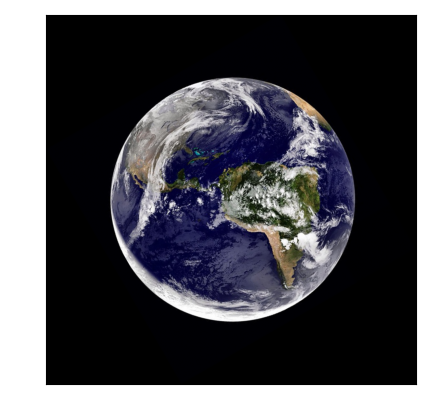

In [145]:
I_rotated = transform.rotate(image, 30, resize=True)
plt.figure()
plt.imshow(I_rotated)

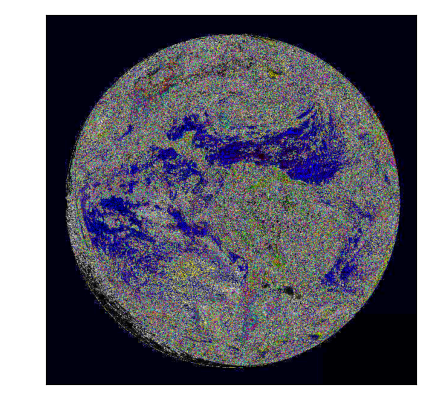

In [146]:
plt.figure()
plt.imshow(image**2)

Text(0.5, 1.0, 'Convolved image')

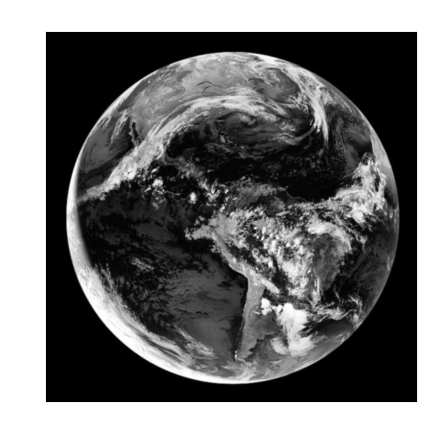

In [147]:
plt.figure()
g = np.array(np.array([1,2,1])* np.array([[1],[2],[1]])/16)
plt.imshow(signal.convolve2d(rgb2gray(image),g))
plt.title('Convolved image')

C:\Users\pmatu\AppData\Local\Temp\ipykernel_22348\1534543973.py:3: RuntimeWarning: divide by zero encountered in log
  io.imshow(np.log(I3))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


True

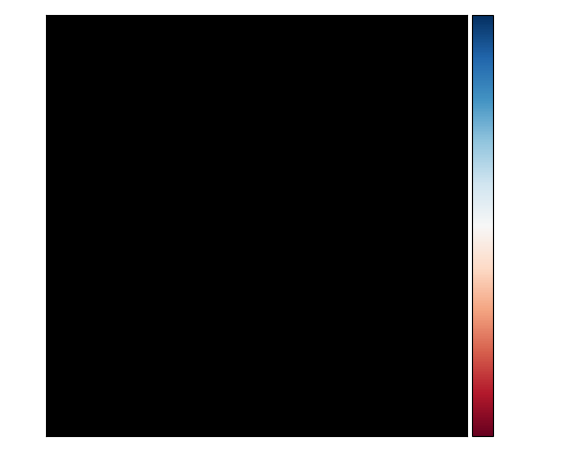

In [148]:
I3 = np.double(I_rotated)
io.imshow(I3**2)
io.imshow(np.log(I3))
I3 = I3.astype(dtype = np.uint8)
cv2.imwrite("test.png", I3)

DU


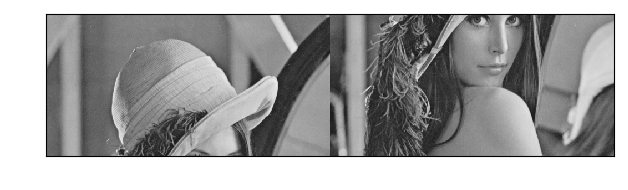

In [149]:
print("DU")

D = 128
im = io.imread('imgs/lena.png')
im = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

if(int(im.shape[0]) % D == 0):
    parts = im.shape[0] / D

    p = np.array_split(im, parts)

    np.random.shuffle(p)

    out1 = np.concatenate((p[0], p[1]),axis=0)
    out2 = np.concatenate((p[2], p[3]),axis=0)


    out = np.concatenate((out1, out2),axis=1)
    io.imshow(out)
else:
    print("Choose another D to proceed")

######## Cviko 4 ########

In [150]:
plt.rcParams['text.color'] = 'w'
plt.rcParams['xtick.color'] = 'w'
plt.rcParams['ytick.color'] = 'w'
plt.rcParams['axes.labelcolor'] = 'w'

C:\Users\pmatu\AppData\Local\Temp\ipykernel_22348\1345056498.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1=plt.subplot(121, frameon=False)


Text(0, 0.5, 'Pixel count ')

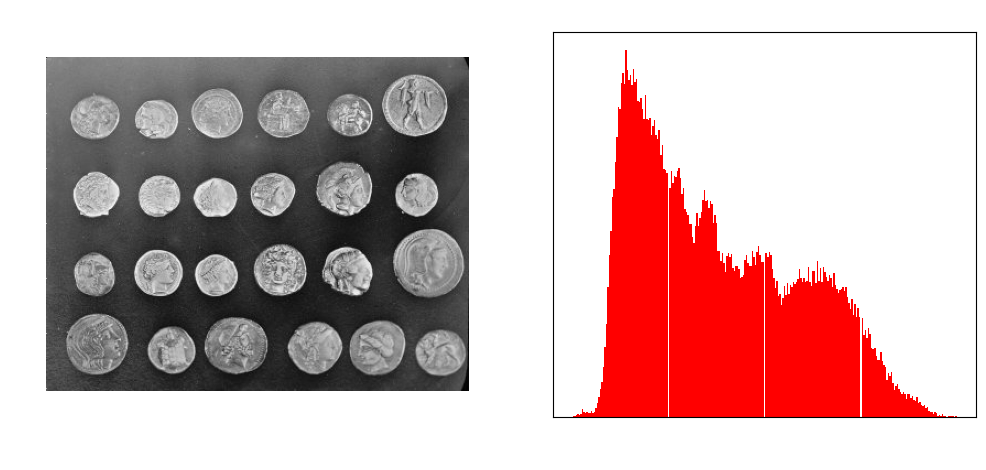

In [151]:
image = skimage.data.coins()
plt.figure(figsize=(12, 5))
plt.subplot(121)
ax1=plt.subplot(121, frameon=False)
ax1.imshow(image,cmap='gray')
ax1.set_title("Coins grayscale image")
ax2 = plt.subplot(1,2,2)
raveled_image = image.ravel()
reshaped_image = np.reshape(image,(image.shape[0]*image.shape[1],))
pt1 = ax2.hist(reshaped_image, bins=255, histtype='bar', color='red')
ax2.set_title("Jasovy histogram")
ax2.set_xlabel("Pixel intensity")
ax2.set_ylabel("Pixel count ")

Text(0.5, 1.0, 'Contrast adjust')

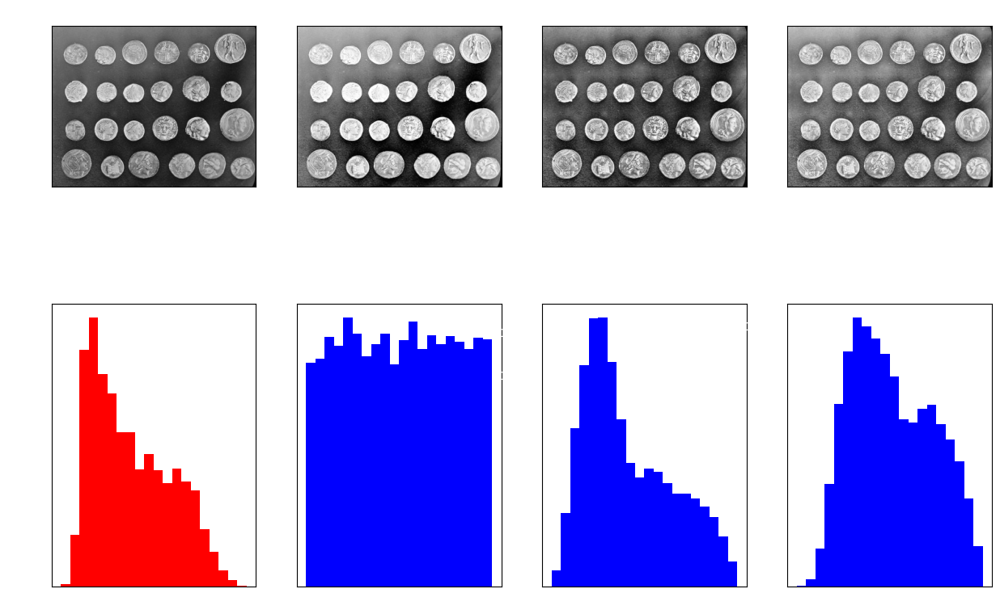

In [152]:
fig = plt.figure(figsize=(15, 10))
axes = np.zeros((2,4),dtype=np.object_)
axes[0,0] = plt.subplot(2, 4, 1)
axes[0,1] = plt.subplot(2, 4, 2)
axes[0,2] = plt.subplot(2, 4, 3)
axes[0,3] = plt.subplot(2, 4, 4)
axes[1,0] = plt.subplot(2, 4, 5)
axes[1,1] = plt.subplot(2, 4, 6)
axes[1,2] = plt.subplot(2, 4, 7)
axes[1,3] = plt.subplot(2, 4, 8)

axes[0,0].imshow(image,cmap='gray')
axes[1,0].hist(image.ravel(), bins=20, histtype='bar', color='red')
axes[0,0].set_title("Original image")

img_eq = exposure.equalize_hist(image)
axes[0,1].imshow(img_eq,cmap='gray')
axes[1,1].hist(img_eq.ravel(), bins=20, histtype='bar', color='blue')
axes[0,1].set_title("Equalizing histogram adjust")

img_adapt_eq = exposure.equalize_adapthist(image)
axes[0,2].imshow(img_adapt_eq,cmap='gray')
axes[1,2].hist(img_adapt_eq.ravel(), bins=20, histtype='bar', color='blue')
axes[0,2].set_title("Adaptive histogram adjust")

img_contrast_enhanced = exposure.equalize_adapthist(exposure.adjust_gamma(image, 0.5))
axes[0,3].imshow(img_contrast_enhanced,cmap='gray')
axes[1,3].hist(img_contrast_enhanced.ravel(), bins=20, histtype='bar', color='blue')
axes[0,3].set_title("Contrast adjust")

(array([8.32000e+02, 6.92000e+02, 6.84000e+02, 8.00000e+02, 1.80000e+03,
        3.56000e+03, 6.97200e+03, 4.69000e+04, 1.56564e+05, 3.71520e+04,
        3.11600e+03, 9.16000e+02, 6.96000e+02, 4.96000e+02, 3.12000e+02,
        1.84000e+02, 9.60000e+01, 9.60000e+01, 1.64000e+02, 1.12000e+02]),
 array([  0.  ,  12.75,  25.5 ,  38.25,  51.  ,  63.75,  76.5 ,  89.25,
        102.  , 114.75, 127.5 , 140.25, 153.  , 165.75, 178.5 , 191.25,
        204.  , 216.75, 229.5 , 242.25, 255.  ]),
 <BarContainer object of 20 artists>)

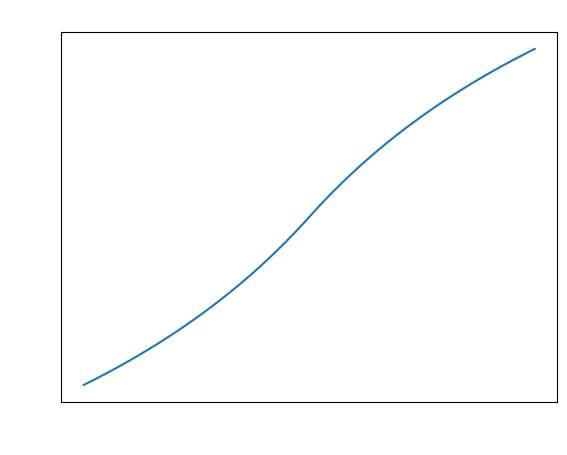

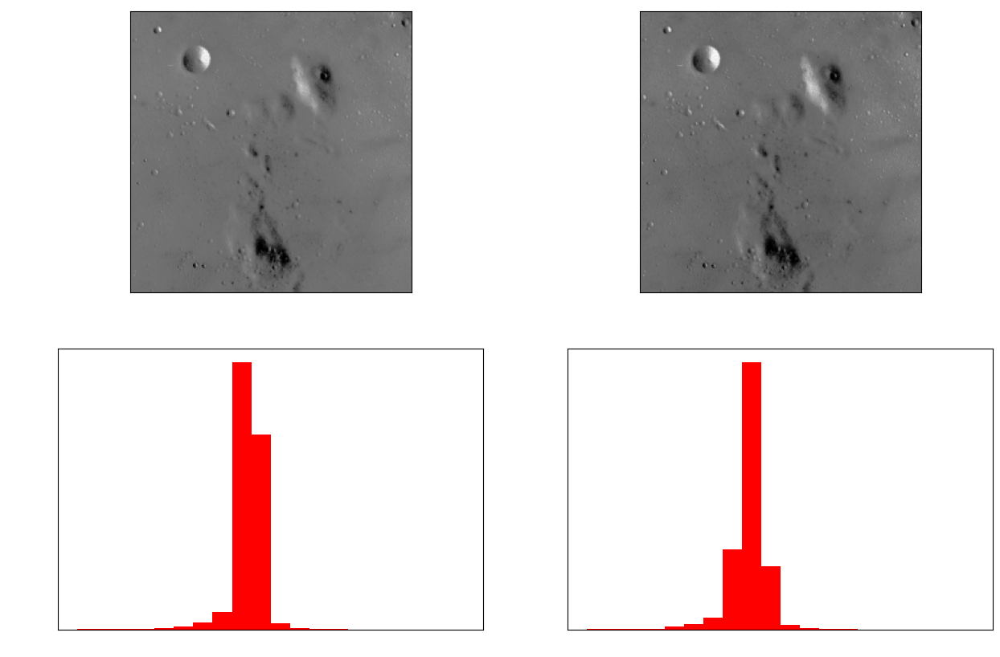

In [153]:
x = np.linspace(0,1,50)
p = 1
c = (0.5*p)/(1+0.5*p)
plt.figure()
y= (((x-0.5)*p)/(1+abs((x-0.5)*p))+c)/(2*c)
plt.plot(x,y)
plt.title('Uprava jasovej stupnice')
plt.xlabel('vstupny jas')
plt.ylabel('out jas')

plt.figure(figsize=(15, 10))
plt.subplot(221)
plt.imshow(data.moon(),cmap='gray')
plt.subplot(222)
im = data.moon()/255
adj_im = (((im-0.5)*p)/(1+abs((im-0.5)*p))+c)/(2*c)
plt.imshow(adj_im,cmap='gray')
plt.subplot(223)
plt.hist(data.moon().ravel(), bins=20, histtype='bar', color='red')
plt.subplot(224)
plt.hist((adj_im*255).ravel(), bins=20, histtype='bar', color='red')

C:\Users\pmatu\AppData\Local\Temp\ipykernel_22348\1399388386.py:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(r.ravel(),g.ravel(),b.ravel(), cmap='viridis', linewidth=0.5)


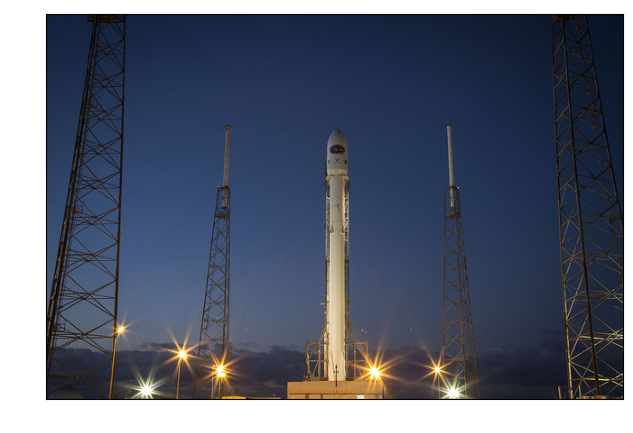

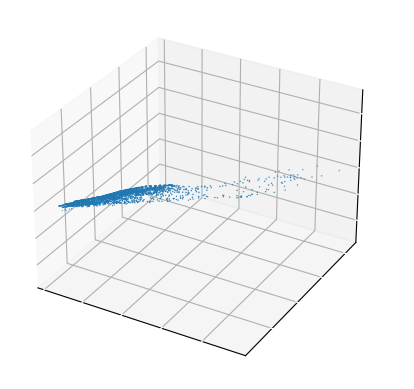

In [154]:
shape = np.floor(np.asarray(data.rocket().shape[0:2])/10).astype(dtype=np.int_)
shape = np.hstack((shape, 3))
im =  transform.resize(data.rocket(),shape)
plt.figure(figsize=(10, 5))
plt.imshow(data.rocket())
plt.figure()
r = im[:,:,0]
g = im[:,:,1]
b = im[:,:,2]
ax = plt.axes(projection='3d')
plt.scatter(r.ravel(),g.ravel(),b.ravel(), cmap='viridis', linewidth=0.5)

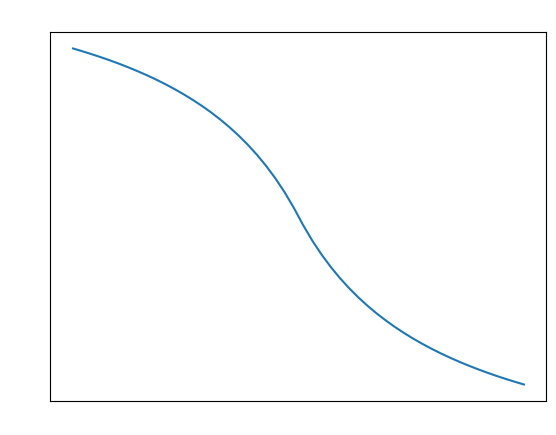

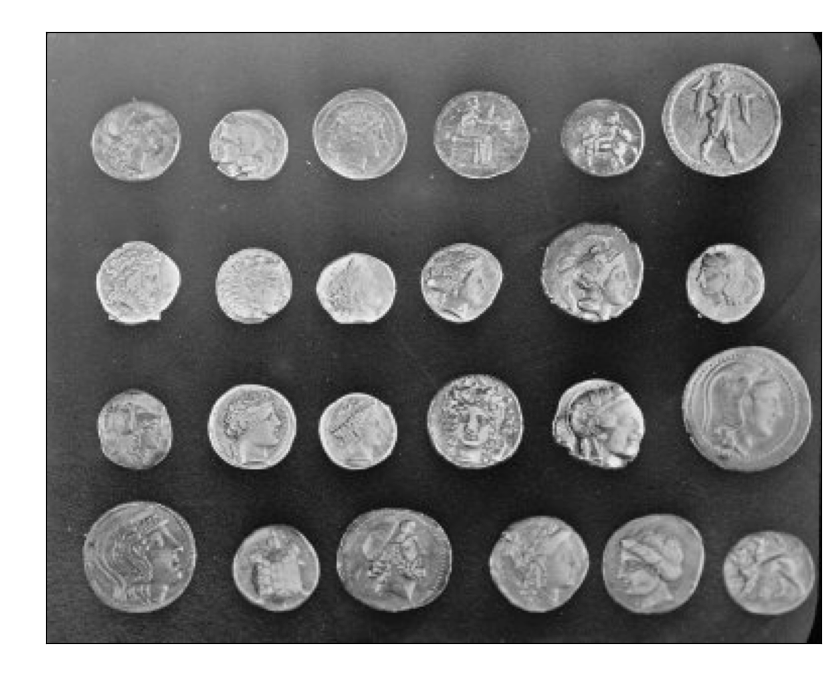

<Figure size 640x480 with 0 Axes>

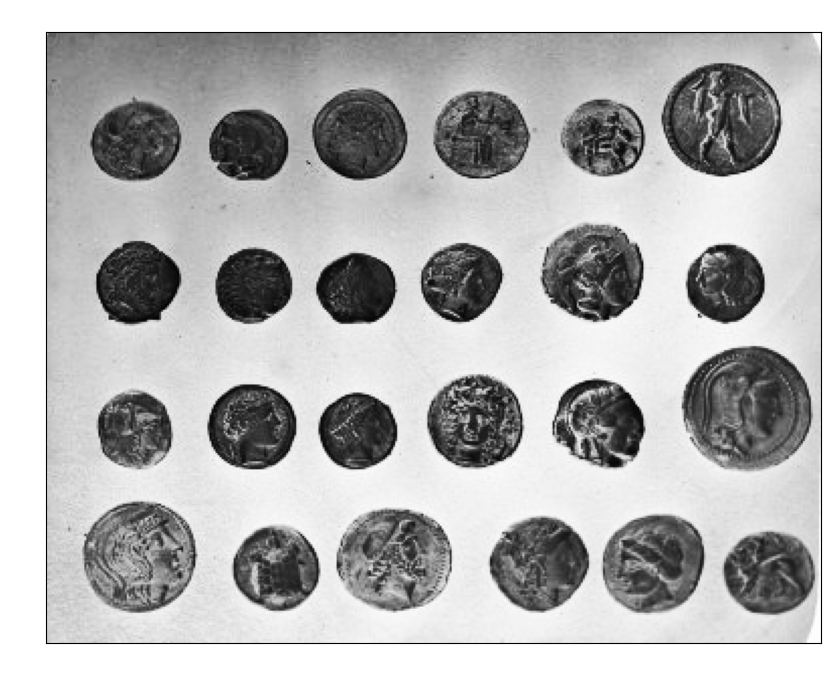

In [155]:
x = np.linspace(0,1,50)
p = 5
c = (0.5*m.pi)/(1+(-0.5)*m.pi)

plt.figure()
plt.plot(x,(((x-0.5)*m.pi)/(1+abs((x-0.5)*m.pi))+c)/(2*c))
plt.title("Uprava jasovej stupnice")


plt.figure(figsize=(10, 10))
pout = data.coins()
plt.imshow(pout,cmap='gray')
plt.title("Original")

plt.figure()
plt.figure(figsize=(10, 10))
img = data.coins()/255
adj_im = (((img-0.5)*m.pi)/(1+abs((img-0.5)*m.pi))+c)/(2*c)
plt.title("Upravena jasova stupnica")
plt.imshow(adj_im,cmap='gray')

Text(0.5, 1.0, 'Negative')

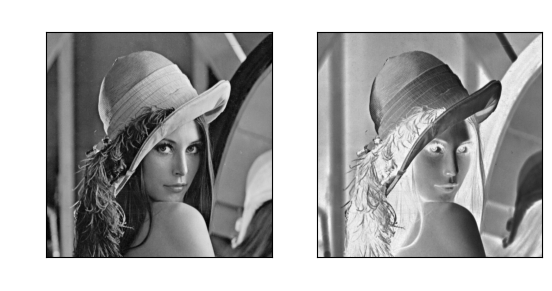

In [156]:
image = cv2.imread("imgs/lena.png")

image = (cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
image = image.astype(dtype=np.uint8)


a = plt.subplot(121)
a.imshow(image, cmap= 'gray')
plt.title("Original")

b = plt.subplot(122)
negative = (1 - image)
b.imshow(negative, cmap= 'gray')
plt.title("Negative")

######## Cviko 5 #######

In [157]:
mask = np.ones((3, 3))
mask = mask * (1/mask.size)
display(mask)

orig_img = data.camera()
conv_img = np.zeros(shape=orig_img.shape)

mask_shape = mask.shape
orig_img_shape = orig_img.shape

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [158]:
for i  in range(0, orig_img_shape[0] - mask_shape[0]+1):
    for j in range(0, orig_img_shape[1] - mask_shape[1]+1):
        mask_img_mult = orig_img[i:i+mask_shape[0],j:j+mask_shape[1]] * mask
        conv_img[i + 1 , j + 1] = np.sum(mask_img_mult)

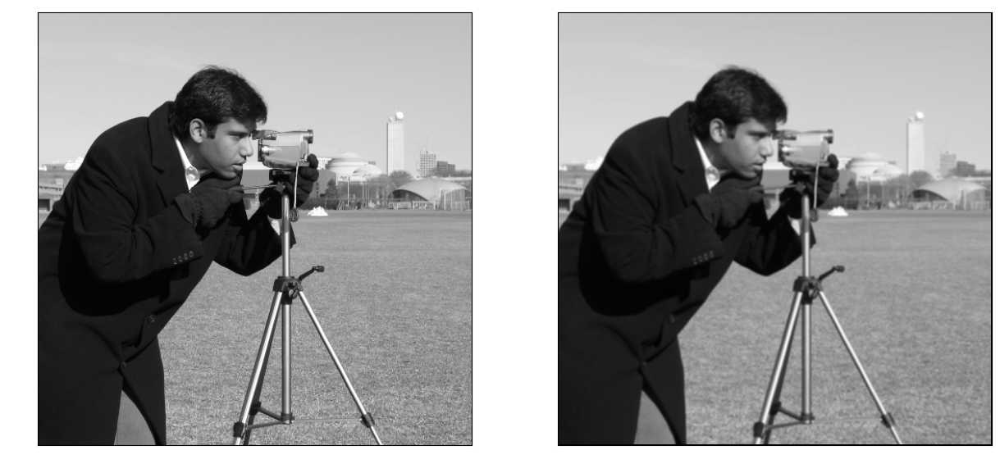

In [159]:
plt.figure(figsize=(15,10))
plt.subplot(121)
plt.imshow(orig_img,cmap='gray')
plt.subplot(122)
plt.imshow(conv_img.astype(dtype=np.uint8),cmap='gray')

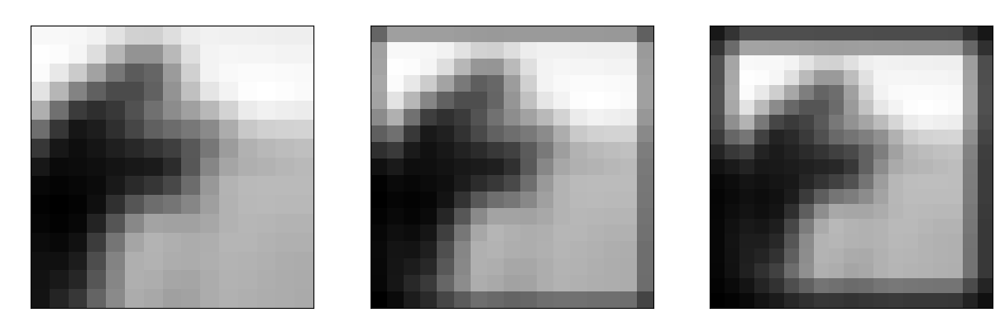

In [160]:
kernel = mask
orig_img2 = transform.resize(orig_img,np.floor(np.array(orig_img_shape)/30).astype(np.uint8))
full_conv = signal.convolve2d(orig_img2, kernel, mode='full')
same_conv = signal.convolve2d(orig_img2, kernel, mode='same')
valid_conv = signal.convolve2d(orig_img2, kernel, mode='valid')
plt.figure(figsize=(15, 10))
plt.set_cmap('gray')
plt.subplot(131)
plt.imshow(valid_conv)
plt.title("Valid Convolution")
plt.subplot(132)
plt.title("Same Convolution")
plt.imshow(same_conv)
plt.subplot(133)
plt.title("Full Convolution")
plt.imshow(full_conv)

array([[0.01134374, 0.08381951, 0.01134374],
       [0.08381951, 0.61934703, 0.08381951],
       [0.01134374, 0.08381951, 0.01134374]])

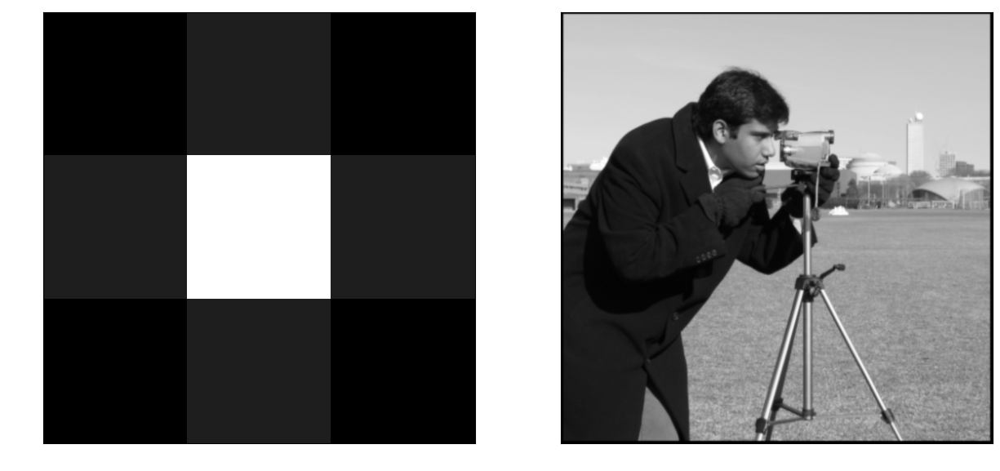

In [161]:
kernel = np.outer(signal.gaussian(3, 0.5), signal.gaussian(3, 0.5))
kernel = kernel / np.sum(kernel)
display(kernel)
plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.imshow(kernel)
plt.subplot(122)
plt.imshow(signal.convolve2d(signal.convolve2d(signal.convolve2d(orig_img,kernel),kernel),kernel))

Text(0.5, 1.0, 'Sobel 2')

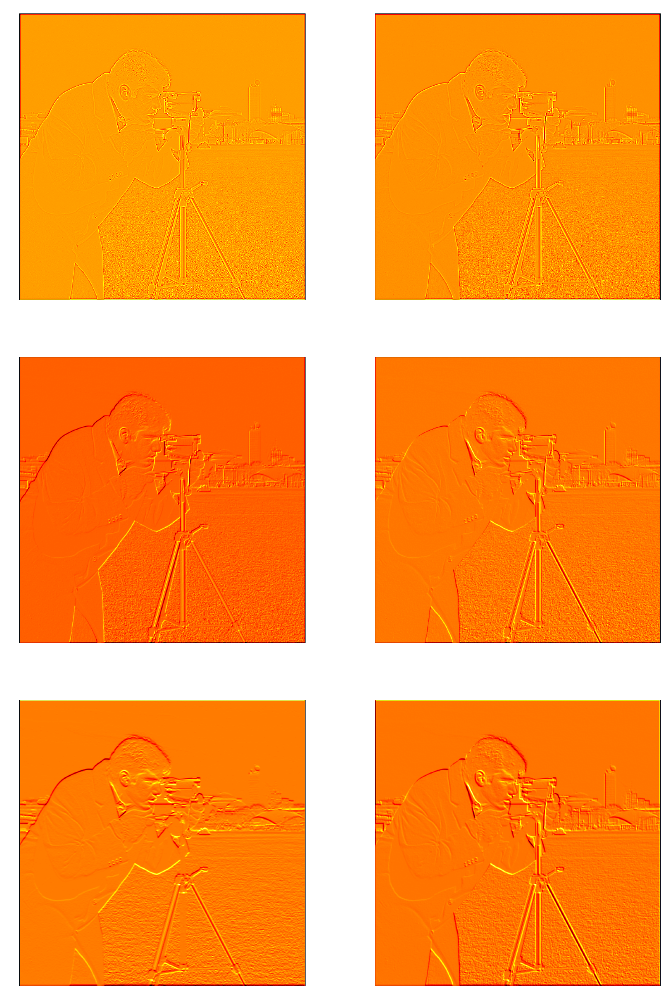

In [162]:
laplace_1_mask = np.array([[0, 1, 0],
                           [1, -4, 1],
                           [0, 1, 0]])

laplace_2_mask = np.ones((3,3))
laplace_2_mask[1,1] = -8

roberts_1_mask = np.array([[1, 0],
                           [0, -1]])
roberts_2_mask = np.array([[0, 1],
                           [-1, 0]])

sobel_1_mask = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
sobel_2_mask = np.array([[0, 1, 2], [-1, 0, 1], [-1, -2, 0]])
plt.figure(figsize=(20, 30))
plt.subplot(321)
plt.imshow(signal.convolve2d(orig_img,laplace_1_mask),cmap='hot')
plt.title("Laplace 1")
plt.subplot(322)
plt.imshow(signal.convolve2d(orig_img,laplace_2_mask),cmap='hot')
plt.title("Laplace 2")
plt.subplot(323)
plt.imshow(signal.convolve2d(orig_img,roberts_1_mask),cmap='hot')
plt.title("Roberts 1")
plt.subplot(324)
plt.imshow(signal.convolve2d(orig_img,roberts_2_mask),cmap='hot')
plt.title("Robert 2")
plt.subplot(325)
plt.imshow(signal.convolve2d(orig_img,sobel_1_mask),cmap='hot')
plt.title("Sobel 1")
plt.subplot(326)
plt.imshow(signal.convolve2d(orig_img,sobel_2_mask),cmap='hot')
plt.title("Sobel 2")

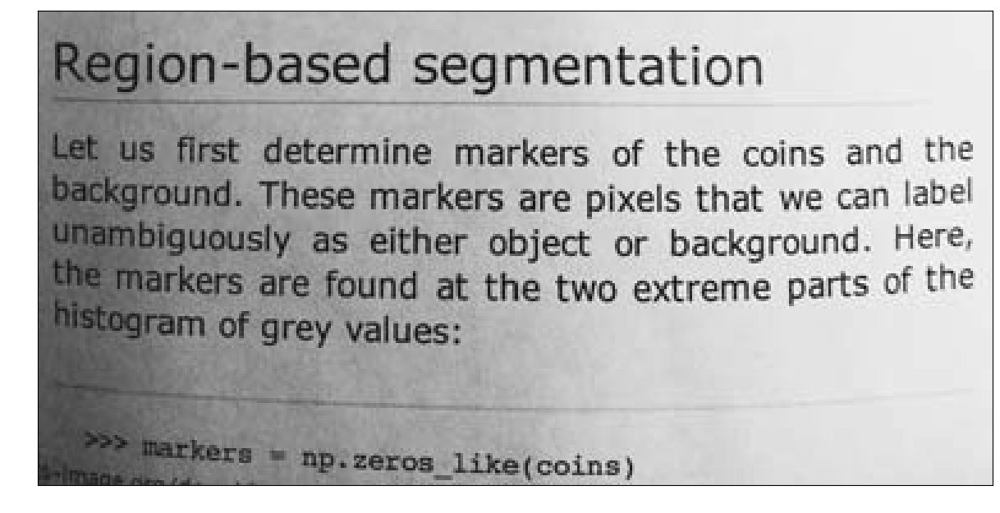

In [163]:
plt.figure(figsize=(15,10))
plt.imshow(data.page())

C:\Users\pmatu\AppData\Local\Temp\ipykernel_22348\1203342791.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(222)


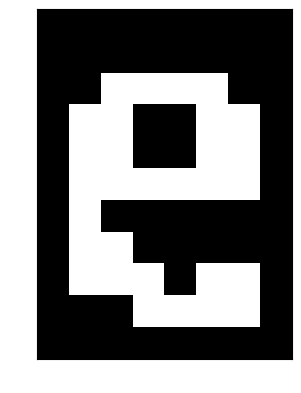

In [164]:
img_with_text = exposure.equalize_adapthist(data.page()) < 0.35
plt.figure(figsize=(15,10))
plt.subplot(211)
plt.imshow(img_with_text)
kernel  = transform.rotate(img_with_text[104:115, 63:71],180)
plt.subplot(222)
plt.imshow(transform.rotate(kernel,180))

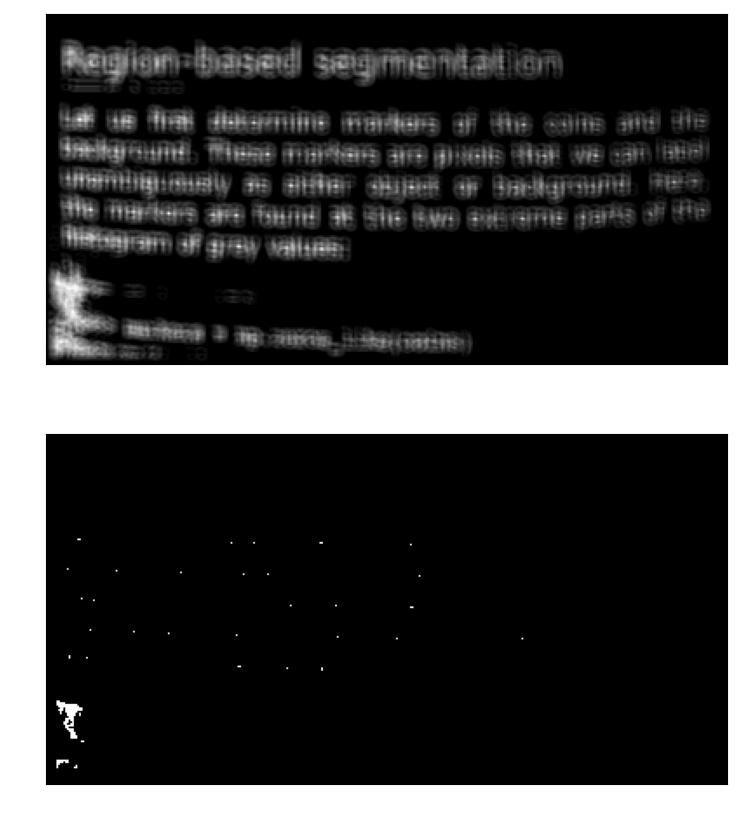

In [165]:
plt.figure(figsize=(15,10))

plt.subplot(211)
out  = signal.convolve2d(img_with_text.astype(np.float32), kernel)
plt.imshow(out)
plt.subplot(212)
plt.imshow(out>0.8*np.max(out))

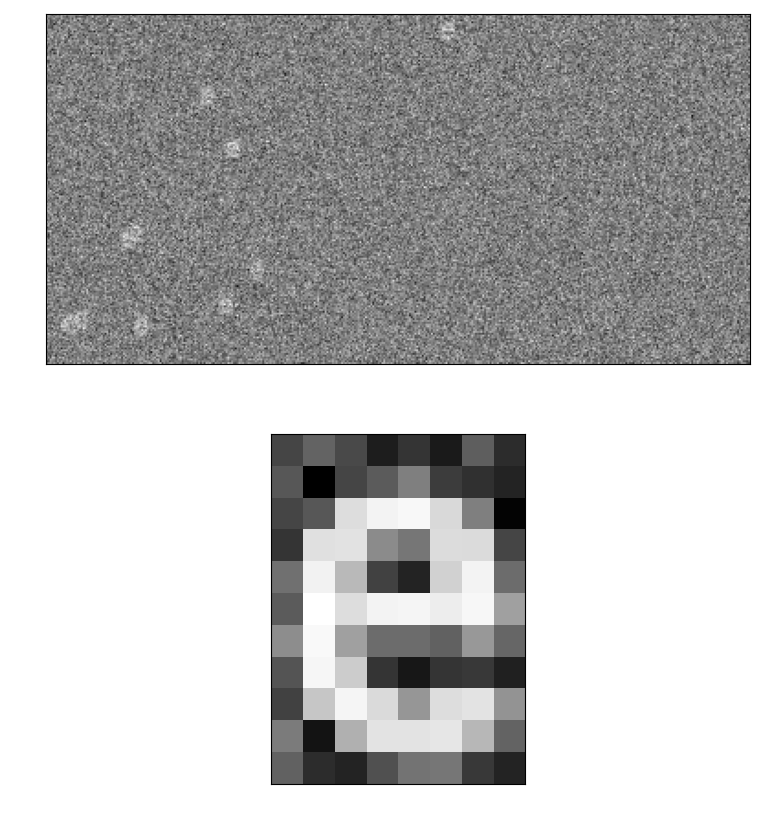

In [166]:
img_with_text = exposure.equalize_hist(data.page())
plt.figure(figsize=(15,10))
plt.subplot(211)
kernel  = 255 -transform.rotate(img_with_text[104:115, 63:71],180)*255
img_with_text =np.ones(shape=img_with_text.shape)*150
random_positions = np.random.rand(10,2)
random_positions[:,0] = random_positions[:,0]* (img_with_text.shape[0] -kernel.shape[0])
random_positions[:,1] = random_positions[:,1]* (img_with_text.shape[1] -kernel.shape[1])
random_positions = np.floor(random_positions).astype(np.uint8)
for rand_pos in random_positions:
    img_with_text[rand_pos[0]:rand_pos[0]+kernel.shape[0],rand_pos[1]:rand_pos[1]+kernel.shape[1]] = transform.rotate(kernel,180)

img_with_text= img_with_text+ np.random.randn(img_with_text.shape[0],img_with_text.shape[1])*50

plt.imshow(img_with_text)

plt.subplot(212)
plt.imshow(transform.rotate(kernel,180))

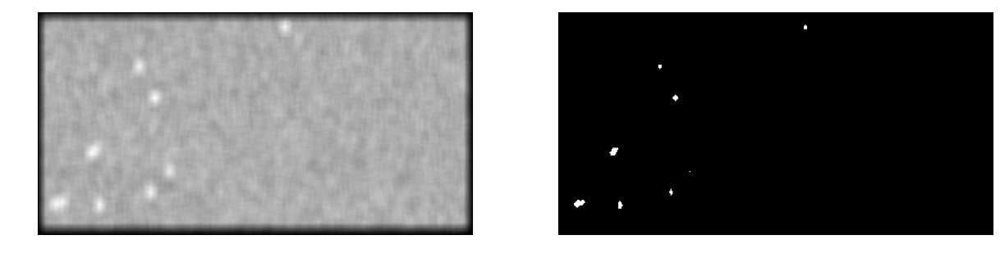

In [167]:
plt.figure(figsize=(15,10))
plt.subplot(121)
out  = signal.convolve2d(img_with_text.astype(np.float32), kernel)
plt.imshow(out)
plt.subplot(122)
plt.imshow(out>0.9*np.max(out))

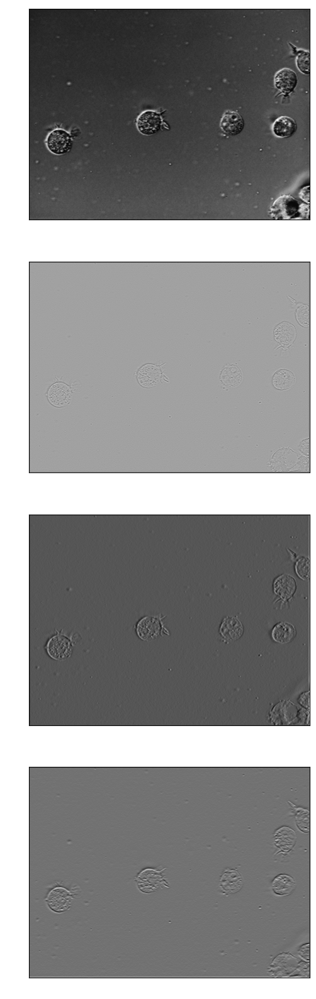

In [168]:
image = io.imread("AT3_1m4_01.tif")
################  MASKS  ################

laplacian = np.array((
	[0, 1, 0],
	[1, -4, 1],
	[0, 1, 0]),
    dtype="int")

sobelX = np.array((
	[-1, 0, 1],
	[-2, 0, 2],
	[-1, 0, 1]),
    dtype="int")

sobelY = np.array((
	[-1, -2, -1],
	[0, 0, 0],
	[1, 2, 1]),
    dtype="int")

################  MASKS  ################

plt.figure(figsize=(30,20))
plt.subplot(411)
plt.imshow(image, cmap='gray')


plt.subplot(412)
lap = signal.convolve2d(image, laplacian)
plt.imshow(lap, cmap='gray')

plt.subplot(413)
sobx = signal.convolve2d(image, sobelX)
plt.imshow(sobx, cmap='gray')

plt.subplot(414)
soby = signal.convolve2d(image, sobelY)
plt.imshow(soby, cmap='gray')

plt.show()

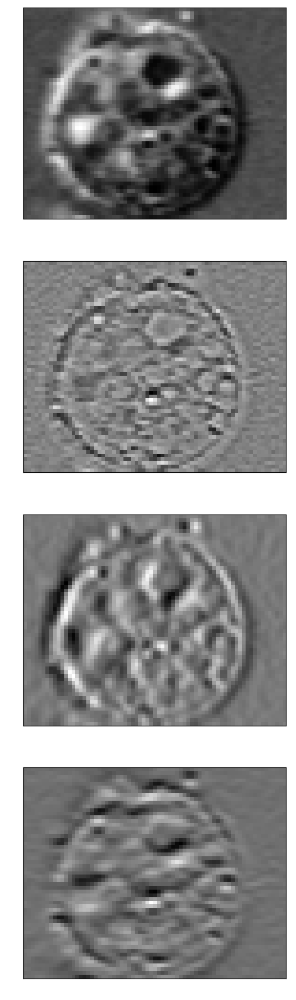

In [169]:
plt.figure(figsize=(30,20))
plt.subplot(411)
image2 = image[230:287, 429:500]
plt.imshow(image2, cmap='gray')

plt.subplot(412)
lap2 = lap[230:287, 429:500]
plt.imshow(lap2, cmap='gray')

plt.subplot(413)
sobx2 = sobx[230:287, 429:500]
plt.imshow(sobx2, cmap='gray')

plt.subplot(414)
soby2 = soby[230:287, 429:500]
plt.imshow(soby2, cmap='gray')

plt.show()

######### Cviko 6 ########

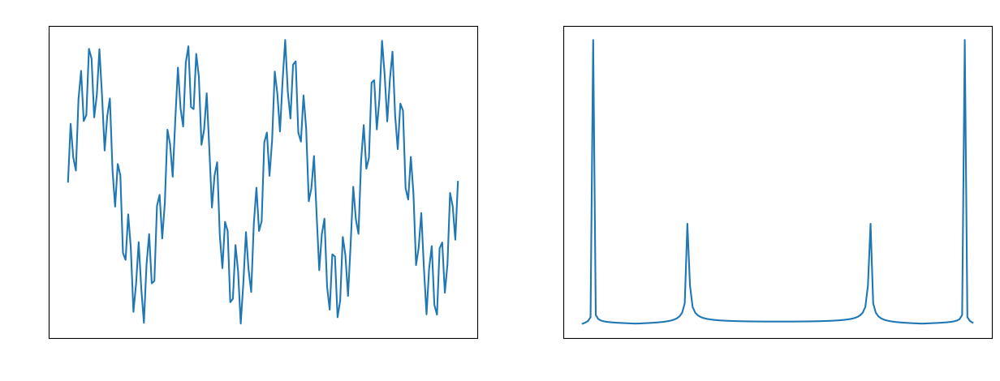

In [170]:
x = np.linspace(0, 8*np.pi, 150)

y_1 = 2*np.sin(x)
y_2 = 0.8*np.sin(10*x)

y = y_1 + y_2

y_f = fft.fft(y)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.plot(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Funkcia z dvoch sinusov s roznym f a A')
plt.subplot(122)
plt.title('Fourrier transform of the signal')
plt.plot(np.abs(y_f))

Text(0, 0.5, 'y')

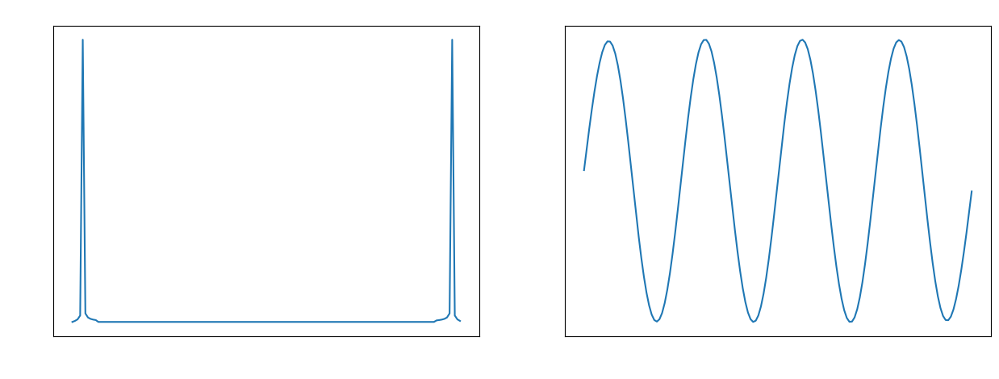

In [171]:
y_f_removed_f = y_f
y_f_removed_f[10:140] = 0  + 0.j
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.plot(np.abs(y_f))
plt.xlabel('y')
plt.ylabel('f')
plt.title('Frekvencne spektrum s jednym odstranenym peakom')
plt.subplot(122)
y_t = fft.ifft(y_f)
plt.plot(x,y_t)
plt.xlabel('x')
plt.ylabel('y')

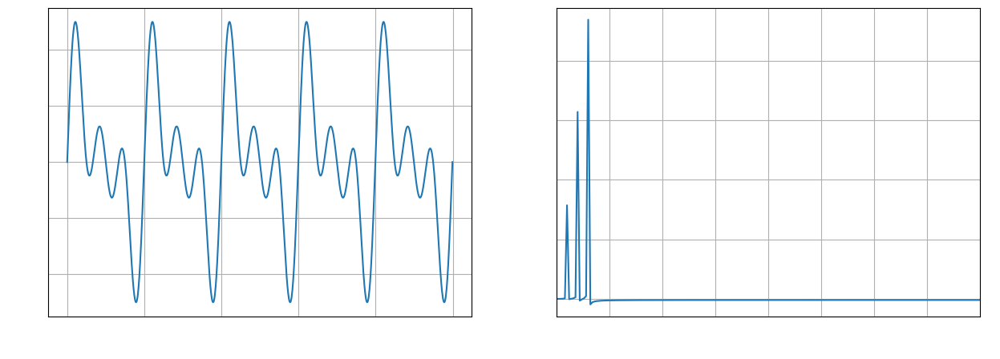

In [172]:
N = 1000
Fs  = 100 # Hz vzorkovacia frekvencia

T = N/Fs

x = np.linspace(0, 10*np.pi, N)

y_1 = np.sin(x) + np.sin(2*x) + np.sin(3*x)

f = np.linspace(0,N-1,N)*Fs/N

plt.figure(figsize=(15,5))
y_f = fft.fft(y_1)

plt.subplot(121)
plt.plot(y_1)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.subplot(122)
plt.plot(f,np.real(y_f))
plt.axis([0,20,np.min(np.real(y_f))-1,np.max(np.real(y_f))+1])
plt.xlabel('Hz')
plt.ylabel('Y*Hz^-1')

plt.grid()

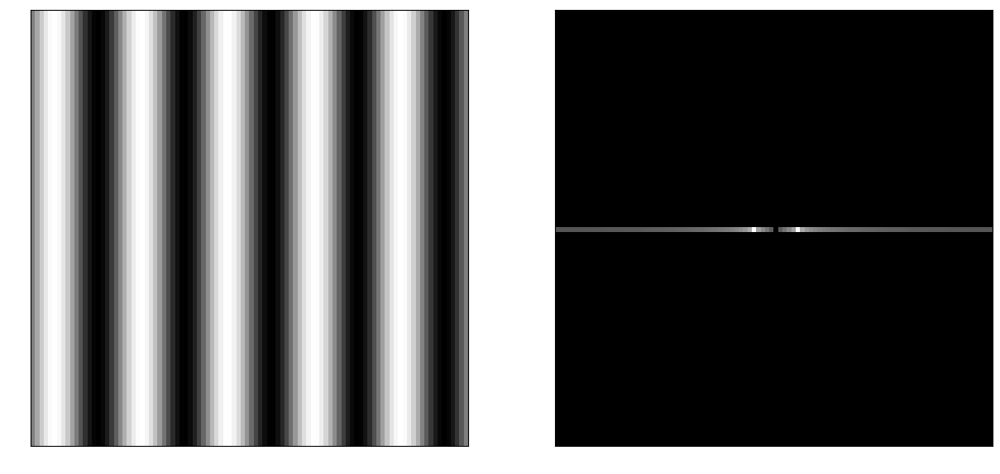

In [173]:
N=100
x = np.array([np.linspace(0,10*np.pi,N)])
y = np.sin(x)
im = np.repeat(y, 100,axis=0)
plt.figure(figsize=(15,10))
plt.subplot(121)
plt.imshow(im)
plt.subplot(122)
im_fft= fft.fft2(im)

zero_center_im_fft = fft.fftshift(im_fft)

plt.imshow(np.log(1+np.abs(zero_center_im_fft)))

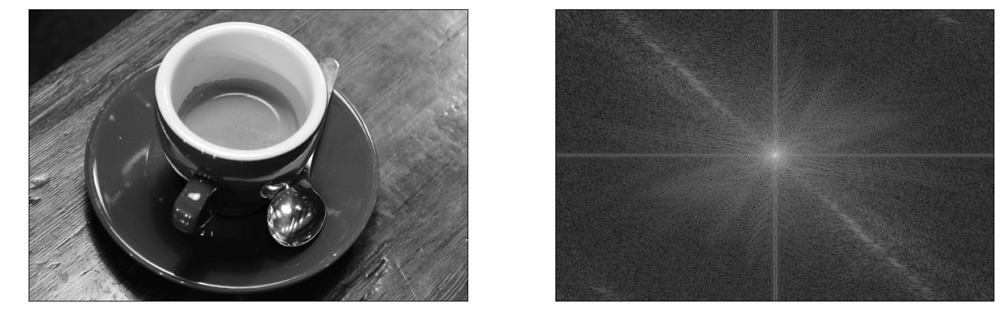

In [174]:
im = rgb2gray(data.coffee())
plt.figure(figsize=(20,15))
plt.subplot(121)
plt.imshow(im,cmap='gray')
plt.subplot(122)
im_fft= fft.fft2(im)
zero_center_im_fft = fft.fftshift(im_fft)
plt.imshow(np.log(1+np.abs(zero_center_im_fft)))

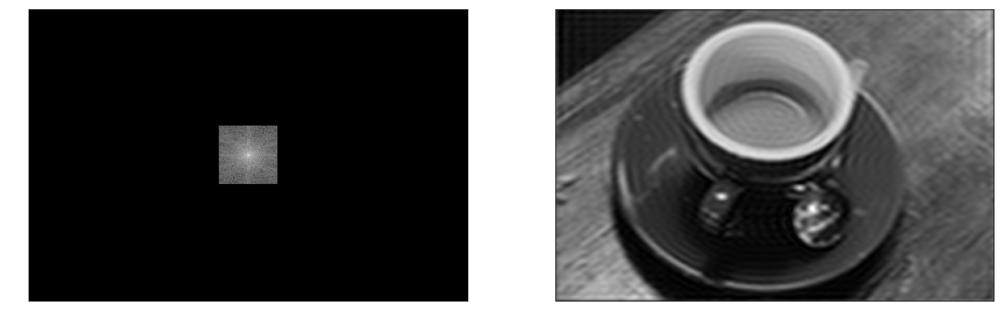

In [175]:
plt.figure(figsize=(20,15))
plt.subplot(121)
pxls = 40

im_fft= fft.fft2(im)
zero_center_im_fft = fft.fftshift(im_fft)
im_size = im.shape
filtered_spectrum = np.zeros(zero_center_im_fft.shape,dtype=np.complex_)

filtered_spectrum[im_size[0]//2-pxls:im_size[0]//2+pxls,im_size[1]//2-pxls:im_size[1]//2+pxls] = zero_center_im_fft[im_size[0]//2-pxls:im_size[0]//2+pxls,im_size[1]//2-pxls:im_size[1]//2+pxls]

plt.imshow(np.log(1+np.abs(filtered_spectrum)))
plt.subplot(122)
inverse_img = fft.ifft2(filtered_spectrum)
plt.imshow(np.abs(inverse_img), cmap='gray')


C:\Users\pmatu\AppData\Local\Temp\ipykernel_22348\3901035143.py:30: RuntimeWarning: invalid value encountered in sqrt
  if(np.sqrt(np.sum(np.power((i - s1 / 2), 2) - np.power((j - s2 / 2), 2)))<radius):
C:\Users\pmatu\AppData\Local\Temp\ipykernel_22348\3901035143.py:39: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(F3)), cmap= 'gray')


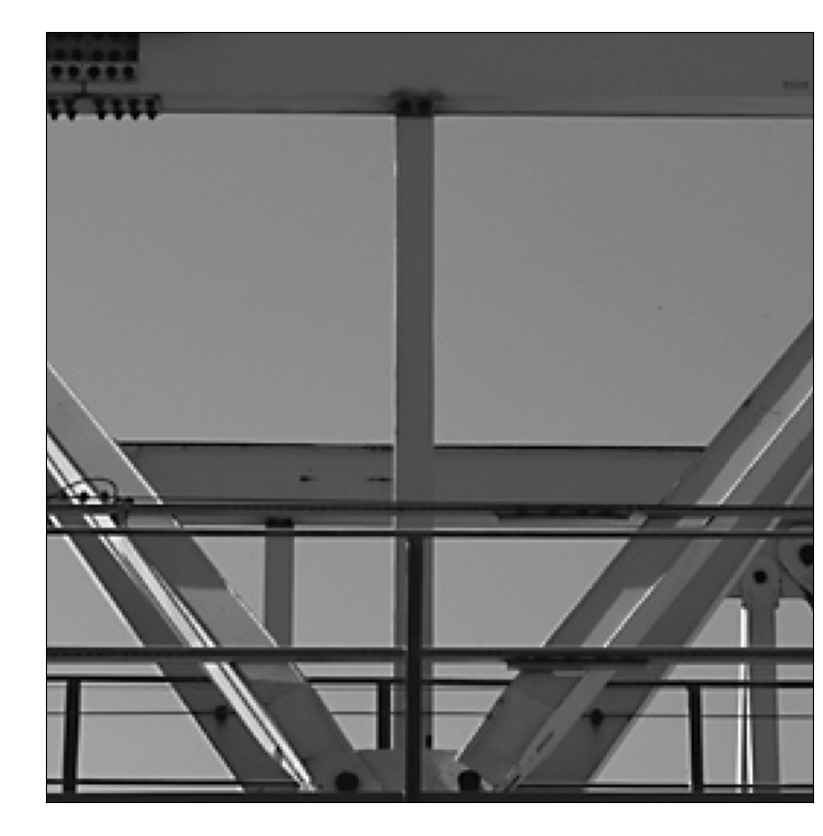

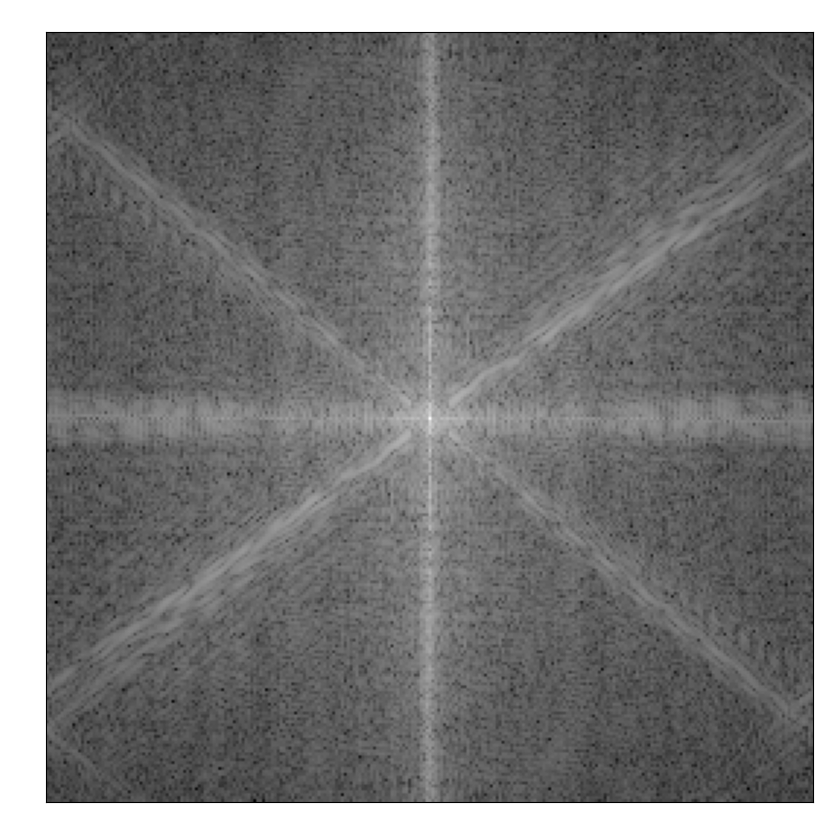

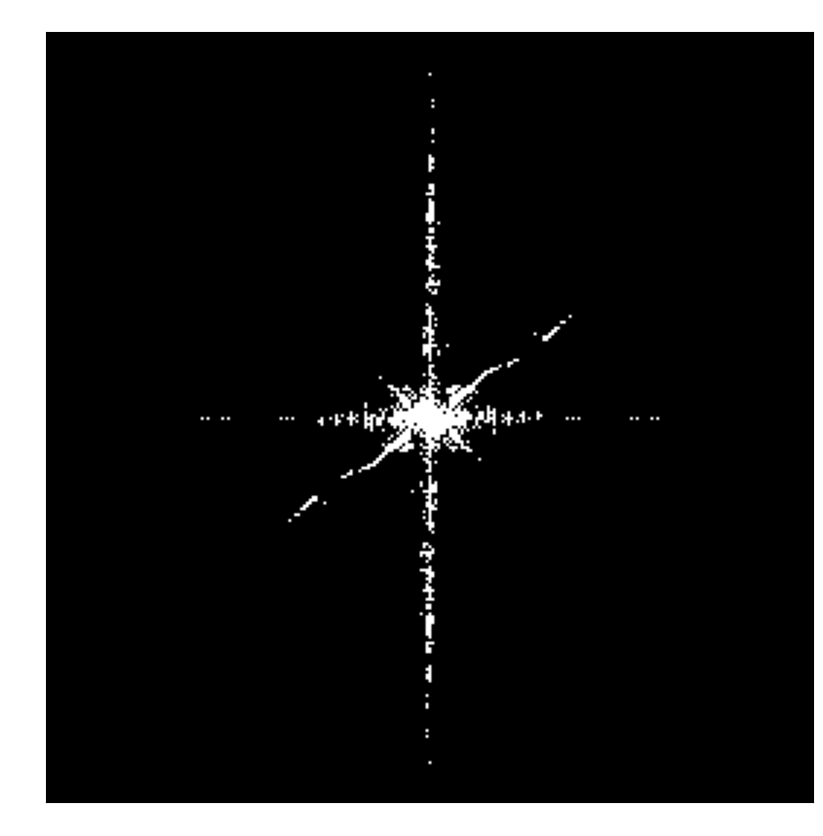

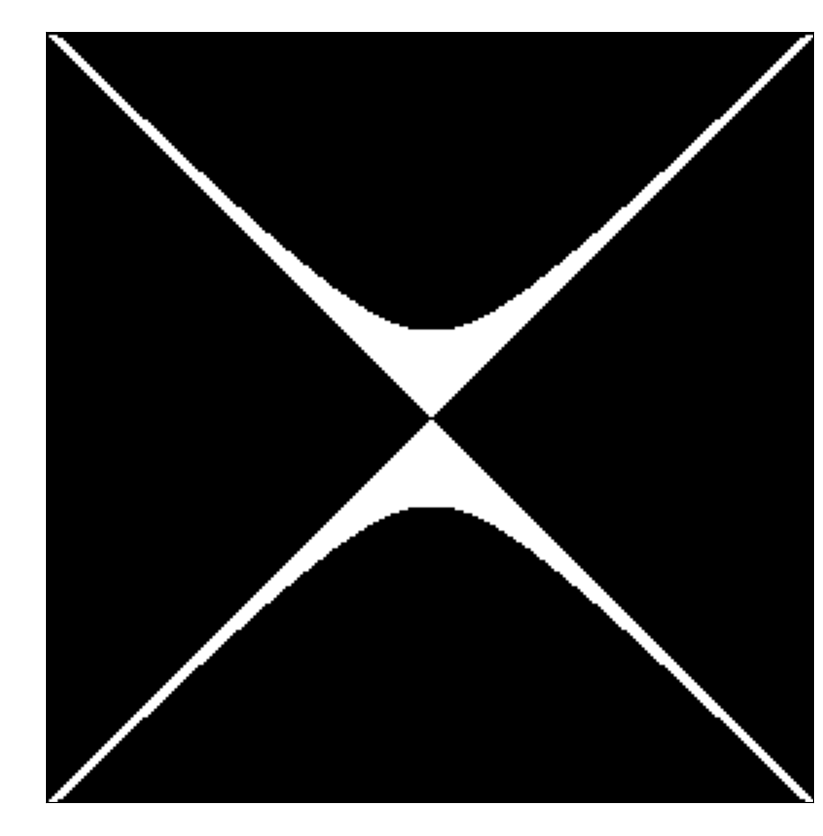

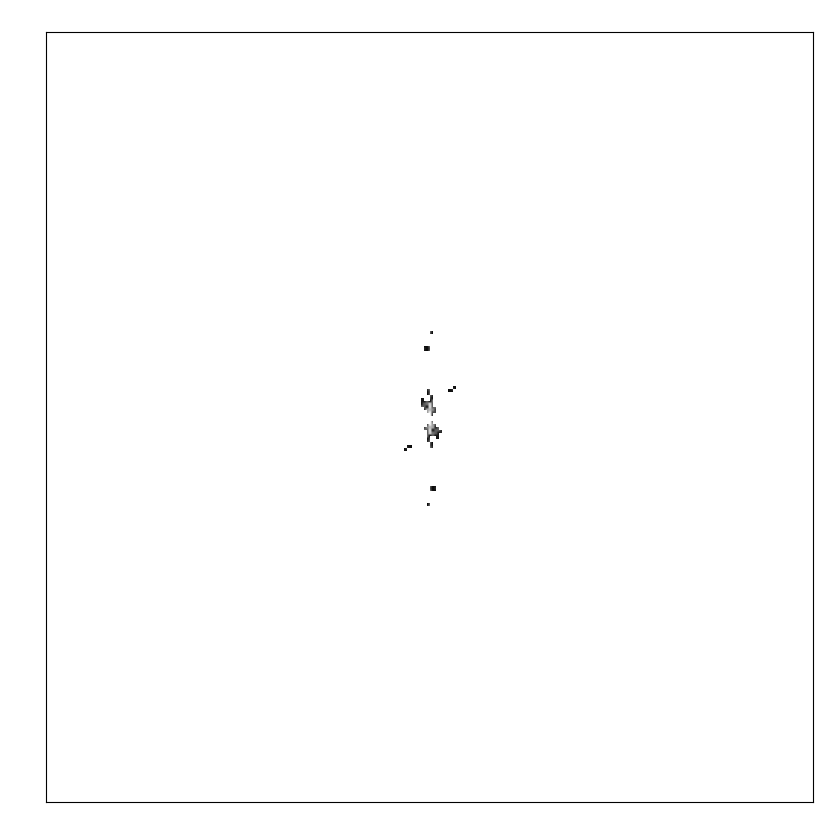

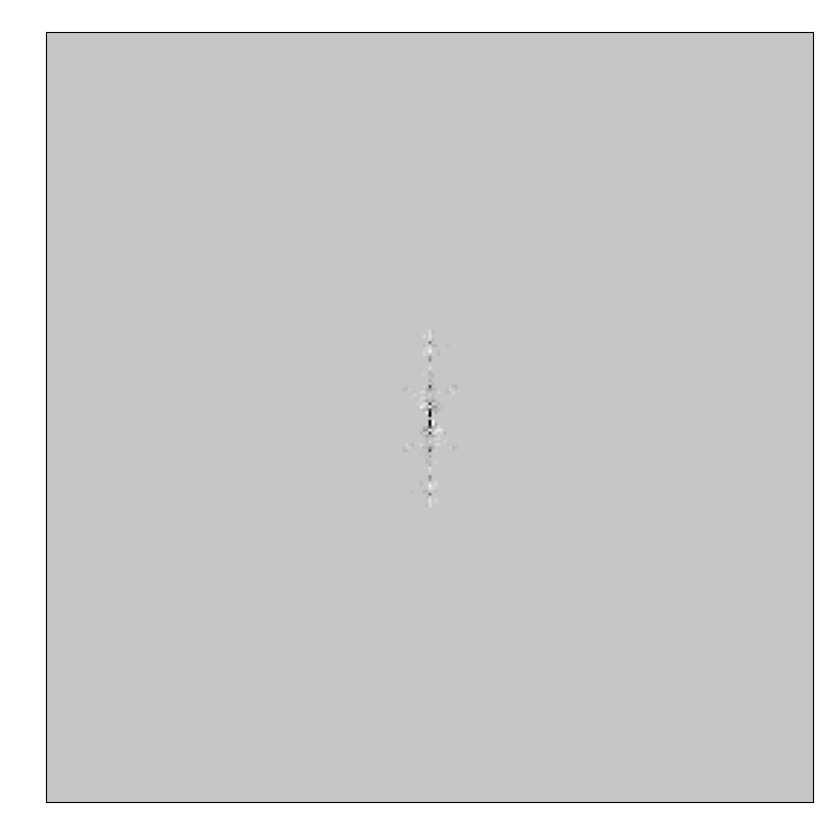

In [176]:
import cv2

Y = cv2.imread("gantrycrane.png")
Y = cv2.cvtColor(Y, cv2.COLOR_RGB2GRAY)
Y = Y[:,69:332]

plt.figure(figsize= (15, 10))
plt.title("Povodny obrazok")
plt.imshow(Y, cmap= 'gray')

F = np.fft.fft2(Y)
F_shift = np.fft.fftshift(F)
F2 = np.log(np.abs(F_shift))
plt.figure(figsize= (15, 10))
plt.title("'Amplitudove spektrum")
plt.imshow(F2, cmap= 'gray')

thresh = np.log(np.abs(F_shift)) > (0.65*np.max(np.max(np.log(np.abs(F_shift)))))
plt.figure(figsize= (15, 10))
plt.title("Amplitudove spektrum, prah")
plt.imshow(thresh, cmap= 'gray')

circ_filter = np.zeros(F.shape)
radius = 30
s1 = circ_filter.shape[0]
s2 = circ_filter.shape[1]

for i in range(1, s1,1):
    for j in range(1, s2,1):
        if(np.sqrt(np.sum(np.power((i - s1 / 2), 2) - np.power((j - s2 / 2), 2)))<radius):
            circ_filter[i,j] = 1;
plt.figure(figsize= (15, 10))
plt.title("Filtrovany obrazok")
plt.imshow(circ_filter, cmap= 'gray')

F3 = F_shift * thresh * circ_filter;
plt.figure(figsize= (15, 10))
plt.title("Amplitudove spektrum, prahovane")
plt.imshow(np.log(np.abs(F3)), cmap= 'gray')

Y = np.fft.ifft2(np.fft.ifftshift(F3))
plt.figure(figsize= (15, 10))
plt.title("Filtrovany obrazok")
plt.imshow(np.real(F3), cmap= 'gray')

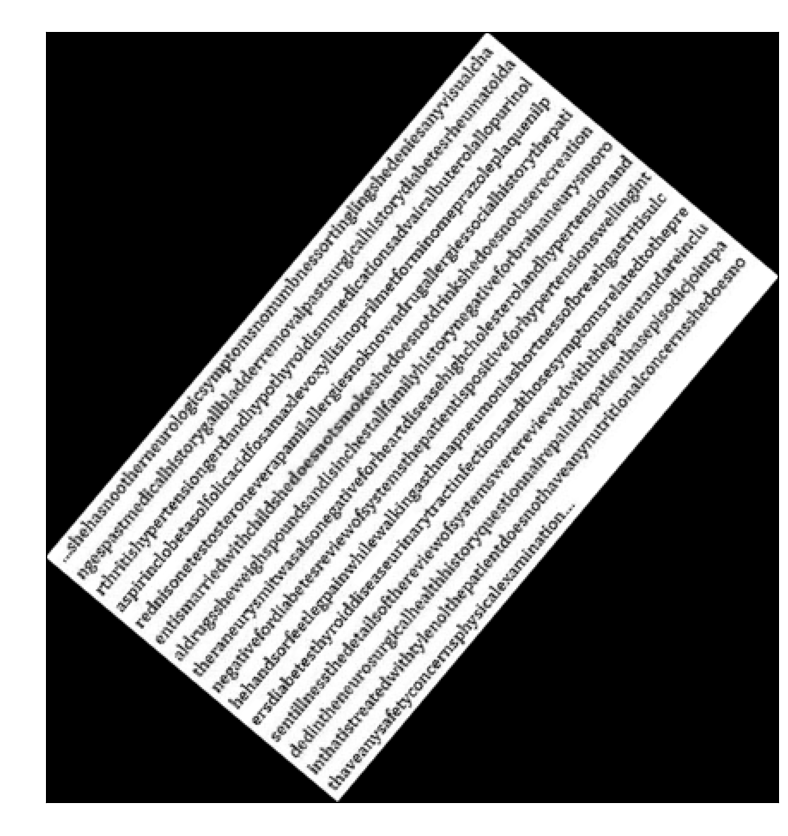

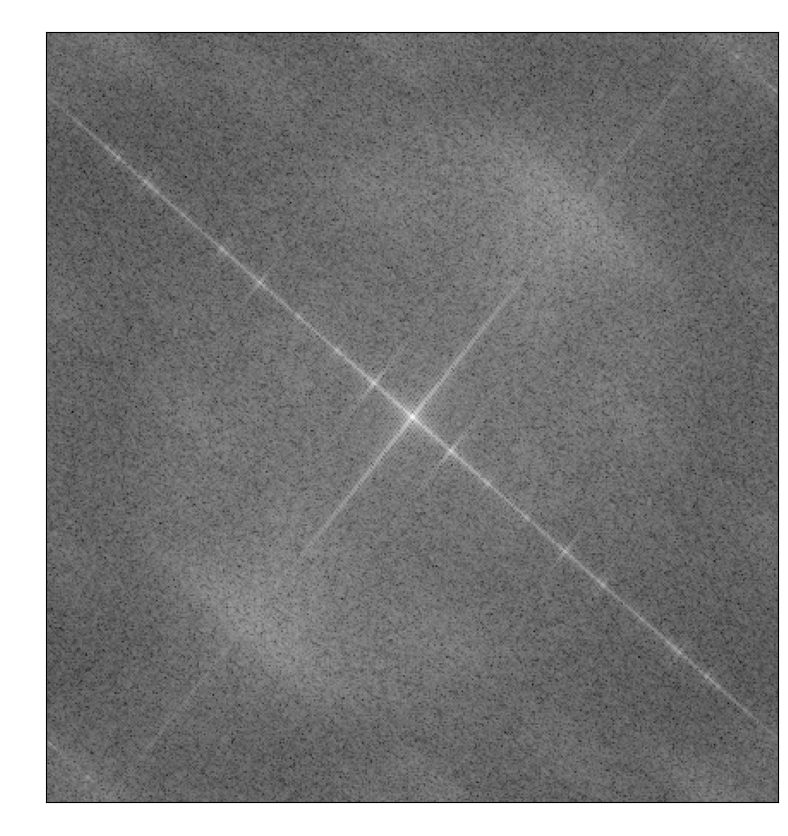

In [177]:
image = cv2.imread("some_text.jpg")
image = transform.rotate(image, 50, resize=True)
image = rgb2gray(image)

plt.figure(figsize= (15, 10))
plt.title("Rotated original")
plt.imshow(image, cmap= 'gray')

im = np.fft.fft2(image)
im = np.fft.fftshift(im)
plt.figure(figsize= (15, 10))
plt.title("Shifted")
plt.imshow(np.log(np.abs(im)))